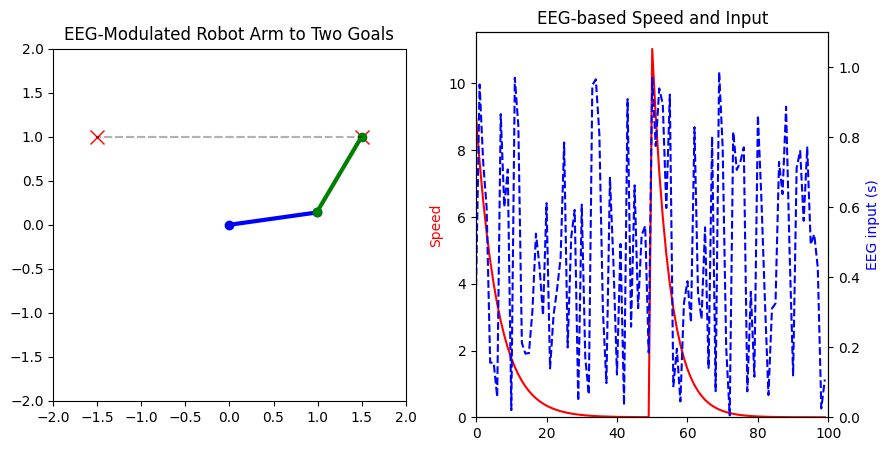

In [5]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# ---------------------
# 로봇팔  robot arm len
L1 = 1.0
L2 = 1.0

# 목표점들 Goals (2 goal)
goals = [np.array([-1.5, 1]), np.array([1.5, 1])]

# EEG 입력 시퀀스
np.random.seed(42)
eeg = np.random.rand(100)  # 총 100 프레임
eeg_chunks = np.array_split(eeg, len(goals))  # 목표점 개수만큼 나눔

# 결과 저장 리스트
theta_list = []
ee_list = []
speed_list = []
eeg_list = []

# 초기 조건
dt = 0.05
start_pos = np.array([1.5, 1])  # 원하는 시작점 (x, y)
theta = inverse_kinematics(start_pos[0], start_pos[1], prefer_elbow_up=False)  # or True if you want elbow up

# 속도 게인 함수 정의 (α(e) = α_min + e * (α_max - α_min))
def get_speed_gain_2nd(eeg_val, alpha_min=0.2, alpha_max=8.0):
    return alpha_min + eeg_val * (alpha_max - alpha_min)  # EEG 값을 이용해 속도 게인 계산

# Forward Kinematics
def fk(t1, t2):
    p1 = np.array([L1 * np.cos(t1), L1 * np.sin(t1)])
    p2 = p1 + np.array([L2 * np.cos(t1 + t2), L2 * np.sin(t1 + t2)])
    return p1, p2


def inverse_kinematics(x, y, current_theta=None, prefer_elbow_up=False):
    D = (x**2 + y**2 - L1**2 - L2**2) / (2 * L1 * L2)
    if np.abs(D) > 1.0:
        return current_theta  # 도달 불가한 경우 현재 각도 유지

    if prefer_elbow_up:
        t2 = np.arctan2(-np.sqrt(1 - D**2), D)  # elbow-up
    else:
        t2 = np.arctan2(np.sqrt(1 - D**2), D)  # elbow-down

    t1 = np.arctan2(y, x) - np.arctan2(L2 * np.sin(t2), L1 + L2 * np.cos(t2))

    return np.array([t1, t2])


# DS Velocity toward goal
def ds_velocity(x, goal):
    return goal - x

# 시뮬레이션 반복
for i, (goal, eeg_seq) in enumerate(zip(goals, eeg_chunks)):
    if i == 0:
        gain = 3.0  # 첫 타겟은 고정 속도 게인
        prefer_elbow_up = True  # 첫 목표: elbow-up
    else:
        avg_eeg = np.mean(eeg_chunks[i - 1])  # 이전 EEG 평균값
        gain = get_speed_gain_2nd(avg_eeg)   # 평균값으로 속도 게인 설정
        prefer_elbow_up = False  # 두 번째 목표: elbow-down

    for eeg_val in eeg_seq:
        p1, p2 = fk(theta[0], theta[1])
        x = p2
        v = ds_velocity(x, goal)
        v_mod = gain * v

        x_next = x + v_mod * dt
        theta = inverse_kinematics(x_next[0], x_next[1], theta, prefer_elbow_up=prefer_elbow_up)

        theta_list.append(theta.copy())
        ee_list.append(x.copy())
        speed_list.append(np.linalg.norm(v_mod))
        eeg_list.append(eeg_val)

# --------------------------
# 애니메이션 설정
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
ax1.set_xlim(-2, 2)
ax1.set_ylim(-2, 2)
ax1.set_aspect('equal')
ax1.set_title("EEG-Modulated Robot Arm to Two Goals")
for g in goals:
    ax1.plot(g[0], g[1], 'rx', markersize=10)

# 로봇 링크 및 궤적
link1, = ax1.plot([], [], 'bo-', lw=3)
link2, = ax1.plot([], [], 'go-', lw=3)
trail, = ax1.plot([], [], 'k--', alpha=0.3)
x_trail, y_trail = [], []

# 속도 및 EEG 플롯
ax2.set_xlim(0, len(speed_list))
ax2.set_ylim(0, max(speed_list) + 0.5)
ax2.set_title("EEG-based Speed and Input")
ax2.set_ylabel("Speed", color='r')
speed_line, = ax2.plot([], [], 'r-', label='Speed')

ax2_eeg = ax2.twinx()
ax2_eeg.set_ylim(0, 1.1)
ax2_eeg.set_ylabel("EEG input (s)", color='b')
eeg_line, = ax2_eeg.plot([], [], 'b--', label='EEG Input')

def animate(i):
    t1, t2 = theta_list[i]
    p1, p2 = fk(t1, t2)

    link1.set_data([0, p1[0]], [0, p1[1]])
    link2.set_data([p1[0], p2[0]], [p1[1], p2[1]])

    x_trail.append(p2[0])
    y_trail.append(p2[1])
    trail.set_data(x_trail, y_trail)

    speed_line.set_data(range(i+1), speed_list[:i+1])
    eeg_line.set_data(range(i+1), eeg_list[:i+1])

    return link1, link2, trail, speed_line, eeg_line

ani = animation.FuncAnimation(fig, animate, frames=len(theta_list), interval=70, blit=True)
HTML(ani.to_jshtml())